In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 10.5 MB/s 
     |████████████████████████████████| 190 kB 39.8 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7020, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 7020 (delta 9), reused 22 (delta 6), pack-reused 6988
Receiving objects: 100% (7020/7020), 13.03 MiB | 6.22 MiB/s, done.
Resolving deltas: 100% (5197/5197), done.


In [ ]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla T4)


In [ ]:
%cd mmsegmentation

/content/mmsegmentation


In [ ]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [ ]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-18 14:01:02--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  8.87MB/s    in 38s     

2022-05-18 14:01:43 (8.28 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [ ]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [128, 128, 0]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [ ]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [ ]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.model.decode_head.loss_decode = dict(type='DiceLoss', loss_weight = 1.0)

In [ ]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [ ]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [ ]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1'

In [ ]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(type='DiceLoss', loss_weight=1.0)),
    train_cfg=dict(),
    test_cfg=dict(mode='slide',

### 모델 학습

In [ ]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-18 14:01:49,903 - mmseg - INFO - Loaded 537 images
2022-05-18 14:02:05,126 - mmseg - INFO - Loaded 113 images
2022-05-18 14:02:05,130 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-18 14:02:05,572 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([19]) from checkpoint, the shape in current model is torch.Size([2]).
2022-05-18 14:02:05,581 - mmseg - INFO - Start running, host: root@50e6cde577f2, work_dir: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1
2022-05-18 14:02:05,582 - mmseg - INFO - Hooks will be executed in the following order:
before_run:
(VER

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 832s, ETA:     0s

2022-05-18 14:36:04,791 - mmseg - INFO - per class results:
2022-05-18 14:36:04,793 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  87.4 |  93.0 |
|  building  | 75.55 | 86.61 |
+------------+-------+-------+
2022-05-18 14:36:04,794 - mmseg - INFO - Summary:
2022-05-18 14:36:04,795 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.93 | 81.48 | 89.81 |
+-------+-------+-------+
2022-05-18 14:36:04,800 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9093, mIoU: 0.8148, mAcc: 0.8981, IoU.background: 0.8740, IoU.building: 0.7555, Acc.background: 0.9300, Acc.building: 0.8661
2022-05-18 14:36:46,651 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 9:55:39, time: 8.741, data_time: 8.349, memory: 3323, decode.loss_dice: 0.0918, decode.acc_seg: 89.6877, loss: 0.0918
2022-05-18 14:37:26,427 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta: 9:13:31, time: 0.398, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 730s, ETA:     0s

2022-05-18 14:55:26,721 - mmseg - INFO - per class results:
2022-05-18 14:55:26,723 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.94 | 93.32 |
|  building  |  78.7 | 89.69 |
+------------+-------+-------+
2022-05-18 14:55:26,725 - mmseg - INFO - Summary:
2022-05-18 14:55:26,729 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.15 | 83.82 | 91.51 |
+-------+-------+-------+
2022-05-18 14:55:26,730 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9215, mIoU: 0.8382, mAcc: 0.9151, IoU.background: 0.8894, IoU.building: 0.7870, Acc.background: 0.9332, Acc.building: 0.8969
2022-05-18 14:56:06,609 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 7:40:17, time: 7.701, data_time: 7.308, memory: 3323, decode.loss_dice: 0.0824, decode.acc_seg: 91.0675, loss: 0.0824
2022-05-18 14:56:48,359 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, eta: 7:22:32, time: 0.417, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 730s, ETA:     0s

2022-05-18 15:14:38,466 - mmseg - INFO - per class results:
2022-05-18 15:14:38,467 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.36 | 93.94 |
|  building  | 79.24 | 89.28 |
+------------+-------+-------+
2022-05-18 15:14:38,468 - mmseg - INFO - Summary:
2022-05-18 15:14:38,470 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.43 | 84.3 | 91.61 |
+-------+------+-------+
2022-05-18 15:14:38,472 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9243, mIoU: 0.8430, mAcc: 0.9161, IoU.background: 0.8936, IoU.building: 0.7924, Acc.background: 0.9394, Acc.building: 0.8928
2022-05-18 15:15:18,278 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 6:39:01, time: 7.702, data_time: 7.309, memory: 3323, decode.loss_dice: 0.0731, decode.acc_seg: 91.7034, loss: 0.0731
2022-05-18 15:15:57,684 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta: 6:27:43, time: 0.394, data_ti

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 15:33:48,571 - mmseg - INFO - per class results:
2022-05-18 15:33:48,573 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.92 | 93.32 |
|  building  | 78.66 | 89.65 |
+------------+-------+-------+
2022-05-18 15:33:48,574 - mmseg - INFO - Summary:
2022-05-18 15:33:48,575 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.13 | 83.79 | 91.48 |
+-------+-------+-------+
2022-05-18 15:33:48,577 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9213, mIoU: 0.8379, mAcc: 0.9148, IoU.background: 0.8892, IoU.building: 0.7866, Acc.background: 0.9332, Acc.building: 0.8965
2022-05-18 15:34:28,386 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 5:58:11, time: 7.710, data_time: 7.317, memory: 3323, decode.loss_dice: 0.0814, decode.acc_seg: 91.4920, loss: 0.0814
2022-05-18 15:35:08,050 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, eta: 5:49:56, time: 0.397, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 15:52:56,331 - mmseg - INFO - per class results:
2022-05-18 15:52:56,333 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.97 | 93.87 |
|  building  |  80.6 | 90.93 |
+------------+-------+-------+
2022-05-18 15:52:56,335 - mmseg - INFO - Summary:
2022-05-18 15:52:56,336 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.92 | 85.29 | 92.4 |
+-------+-------+------+
2022-05-18 15:52:56,338 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9292, mIoU: 0.8529, mAcc: 0.9240, IoU.background: 0.8997, IoU.building: 0.8060, Acc.background: 0.9387, Acc.building: 0.9093
2022-05-18 15:53:36,236 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 5:25:44, time: 7.713, data_time: 7.319, memory: 3323, decode.loss_dice: 0.0666, decode.acc_seg: 92.4532, loss: 0.0666
2022-05-18 15:54:15,941 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, eta: 5:19:12, time: 0.397, data_ti

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 16:12:04,704 - mmseg - INFO - per class results:
2022-05-18 16:12:04,706 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.41 | 94.49 |
|  building  |  81.2 | 90.55 |
+------------+-------+-------+
2022-05-18 16:12:04,709 - mmseg - INFO - Summary:
2022-05-18 16:12:04,710 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.22 | 85.8 | 92.52 |
+-------+------+-------+
2022-05-18 16:12:04,712 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9322, mIoU: 0.8580, mAcc: 0.9252, IoU.background: 0.9041, IoU.building: 0.8120, Acc.background: 0.9449, Acc.building: 0.9055
2022-05-18 16:12:44,284 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 4:57:39, time: 7.705, data_time: 7.315, memory: 3323, decode.loss_dice: 0.0698, decode.acc_seg: 92.3531, loss: 0.0698
2022-05-18 16:13:24,080 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, eta: 4:52:13, time: 0.398, data_ti

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 16:31:08,580 - mmseg - INFO - per class results:
2022-05-18 16:31:08,582 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.36 | 96.13 |
|  building  | 80.16 | 86.65 |
+------------+-------+-------+
2022-05-18 16:31:08,583 - mmseg - INFO - Summary:
2022-05-18 16:31:08,585 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.06 | 85.26 | 91.39 |
+-------+-------+-------+
2022-05-18 16:31:08,587 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9306, mIoU: 0.8526, mAcc: 0.9139, IoU.background: 0.9036, IoU.building: 0.8016, Acc.background: 0.9613, Acc.building: 0.8665
2022-05-18 16:31:48,432 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 4:31:59, time: 7.705, data_time: 7.312, memory: 3323, decode.loss_dice: 0.0679, decode.acc_seg: 92.6729, loss: 0.0679
2022-05-18 16:32:28,348 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta: 4:27:18, time: 0.399, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 733s, ETA:     0s

2022-05-18 16:50:14,519 - mmseg - INFO - per class results:
2022-05-18 16:50:14,521 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.0 | 96.35 |
|  building  | 81.49 | 87.72 |
+------------+-------+-------+
2022-05-18 16:50:14,522 - mmseg - INFO - Summary:
2022-05-18 16:50:14,524 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.56 | 86.25 | 92.03 |
+-------+-------+-------+
2022-05-18 16:50:14,526 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9356, mIoU: 0.8625, mAcc: 0.9203, IoU.background: 0.9100, IoU.building: 0.8149, Acc.background: 0.9635, Acc.building: 0.8772
2022-05-18 16:50:56,510 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 4:08:02, time: 7.748, data_time: 7.354, memory: 3323, decode.loss_dice: 0.0646, decode.acc_seg: 92.8892, loss: 0.0646
2022-05-18 16:51:36,470 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, eta: 4:03:54, time: 0.400, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 17:09:22,027 - mmseg - INFO - per class results:
2022-05-18 17:09:22,029 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.74 | 95.41 |
|  building  | 81.43 | 89.24 |
+------------+-------+-------+
2022-05-18 17:09:22,031 - mmseg - INFO - Summary:
2022-05-18 17:09:22,032 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.42 | 86.09 | 92.33 |
+-------+-------+-------+
2022-05-18 17:09:22,034 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9342, mIoU: 0.8609, mAcc: 0.9233, IoU.background: 0.9074, IoU.building: 0.8143, Acc.background: 0.9541, Acc.building: 0.8924
2022-05-18 17:10:01,763 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 3:45:05, time: 7.708, data_time: 7.316, memory: 3323, decode.loss_dice: 0.0647, decode.acc_seg: 92.8824, loss: 0.0647
2022-05-18 17:10:43,405 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 3:41:24, time: 0.416, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 17:28:28,188 - mmseg - INFO - per class results:
2022-05-18 17:28:28,190 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.97 | 95.68 |
|  building  | 81.79 | 89.18 |
+------------+-------+-------+
2022-05-18 17:28:28,191 - mmseg - INFO - Summary:
2022-05-18 17:28:28,192 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.58 | 86.38 | 92.43 |
+-------+-------+-------+
2022-05-18 17:28:28,194 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9358, mIoU: 0.8638, mAcc: 0.9243, IoU.background: 0.9097, IoU.building: 0.8179, Acc.background: 0.9568, Acc.building: 0.8918
2022-05-18 17:29:07,815 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 3:22:55, time: 7.706, data_time: 7.315, memory: 3323, decode.loss_dice: 0.0607, decode.acc_seg: 93.3090, loss: 0.0607
2022-05-18 17:29:47,403 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 3:19:32, time: 0.396, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 17:47:33,638 - mmseg - INFO - per class results:
2022-05-18 17:47:33,640 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.24 | 95.96 |
|  building  | 82.23 | 89.17 |
+------------+-------+-------+
2022-05-18 17:47:33,643 - mmseg - INFO - Summary:
2022-05-18 17:47:33,644 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.77 | 86.74 | 92.57 |
+-------+-------+-------+
2022-05-18 17:47:33,648 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9377, mIoU: 0.8674, mAcc: 0.9257, IoU.background: 0.9124, IoU.building: 0.8223, Acc.background: 0.9596, Acc.building: 0.8917
2022-05-18 17:48:13,320 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 3:01:17, time: 7.705, data_time: 7.314, memory: 3323, decode.loss_dice: 0.0539, decode.acc_seg: 93.8716, loss: 0.0539
2022-05-18 17:48:52,901 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, eta: 2:58:10, time: 0.396, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 18:06:41,980 - mmseg - INFO - per class results:
2022-05-18 18:06:41,981 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.07 | 94.47 |
|  building  | 82.64 | 92.21 |
+------------+-------+-------+
2022-05-18 18:06:41,982 - mmseg - INFO - Summary:
2022-05-18 18:06:41,984 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.73 | 86.86 | 93.34 |
+-------+-------+-------+
2022-05-18 18:06:41,987 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9373, mIoU: 0.8686, mAcc: 0.9334, IoU.background: 0.9107, IoU.building: 0.8264, Acc.background: 0.9447, Acc.building: 0.9221
2022-05-18 18:07:21,768 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 2:40:07, time: 7.707, data_time: 7.315, memory: 3323, decode.loss_dice: 0.0636, decode.acc_seg: 93.4215, loss: 0.0636
2022-05-18 18:08:01,426 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, eta: 2:37:13, time: 0.397, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 18:25:47,917 - mmseg - INFO - per class results:
2022-05-18 18:25:47,918 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.06 | 95.53 |
|  building  | 82.08 | 89.75 |
+------------+-------+-------+
2022-05-18 18:25:47,923 - mmseg - INFO - Summary:
2022-05-18 18:25:47,924 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.66 | 86.57 | 92.64 |
+-------+-------+-------+
2022-05-18 18:25:47,926 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9366, mIoU: 0.8657, mAcc: 0.9264, IoU.background: 0.9106, IoU.building: 0.8208, Acc.background: 0.9553, Acc.building: 0.8975
2022-05-18 18:26:27,492 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 2:19:14, time: 7.701, data_time: 7.311, memory: 3323, decode.loss_dice: 0.0584, decode.acc_seg: 93.6250, loss: 0.0584
2022-05-18 18:27:07,023 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, eta: 2:16:31, time: 0.395, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 18:44:51,608 - mmseg - INFO - per class results:
2022-05-18 18:44:51,609 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.33 | 95.02 |
|  building  | 82.92 | 91.56 |
+------------+-------+-------+
2022-05-18 18:44:51,612 - mmseg - INFO - Summary:
2022-05-18 18:44:51,614 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.9 | 87.13 | 93.29 |
+------+-------+-------+
2022-05-18 18:44:51,622 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9390, mIoU: 0.8713, mAcc: 0.9329, IoU.background: 0.9133, IoU.building: 0.8292, Acc.background: 0.9502, Acc.building: 0.9156
2022-05-18 18:45:31,430 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 1:58:35, time: 7.705, data_time: 7.312, memory: 3323, decode.loss_dice: 0.0594, decode.acc_seg: 93.5284, loss: 0.0594
2022-05-18 18:46:11,248 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, eta: 1:56:01, time: 0.398, data_

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 730s, ETA:     0s

2022-05-18 19:03:55,658 - mmseg - INFO - per class results:
2022-05-18 19:03:55,660 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.43 | 95.21 |
|  building  | 83.05 | 91.37 |
+------------+-------+-------+
2022-05-18 19:03:55,661 - mmseg - INFO - Summary:
2022-05-18 19:03:55,663 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.97 | 87.24 | 93.29 |
+-------+-------+-------+
2022-05-18 19:03:55,668 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9397, mIoU: 0.8724, mAcc: 0.9329, IoU.background: 0.9143, IoU.building: 0.8305, Acc.background: 0.9521, Acc.building: 0.9137
2022-05-18 19:04:37,597 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:38:10, time: 7.724, data_time: 7.331, memory: 3323, decode.loss_dice: 0.0589, decode.acc_seg: 93.9164, loss: 0.0589
2022-05-18 19:05:17,552 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, eta: 1:35:44, time: 0.400, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 729s, ETA:     0s

2022-05-18 19:23:02,561 - mmseg - INFO - per class results:
2022-05-18 19:23:02,563 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.38 | 94.77 |
|  building  | 83.15 | 92.25 |
+------------+-------+-------+
2022-05-18 19:23:02,565 - mmseg - INFO - Summary:
2022-05-18 19:23:02,568 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.95 | 87.26 | 93.51 |
+-------+-------+-------+
2022-05-18 19:23:02,569 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9395, mIoU: 0.8726, mAcc: 0.9351, IoU.background: 0.9138, IoU.building: 0.8315, Acc.background: 0.9477, Acc.building: 0.9225
2022-05-18 19:23:42,242 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 1:17:54, time: 7.692, data_time: 7.300, memory: 3323, decode.loss_dice: 0.0625, decode.acc_seg: 93.4355, loss: 0.0625
2022-05-18 19:24:24,010 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, eta: 1:15:35, time: 0.418, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 730s, ETA:     0s

2022-05-18 19:42:08,036 - mmseg - INFO - per class results:
2022-05-18 19:42:08,037 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.47 | 94.94 |
|  building  | 83.25 | 92.06 |
+------------+-------+-------+
2022-05-18 19:42:08,042 - mmseg - INFO - Summary:
2022-05-18 19:42:08,043 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 94.01 | 87.36 | 93.5 |
+-------+-------+------+
2022-05-18 19:42:08,046 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9401, mIoU: 0.8736, mAcc: 0.9350, IoU.background: 0.9147, IoU.building: 0.8325, Acc.background: 0.9494, Acc.building: 0.9206
2022-05-18 19:42:47,826 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:57:46, time: 7.697, data_time: 7.305, memory: 3323, decode.loss_dice: 0.0586, decode.acc_seg: 93.4172, loss: 0.0586
2022-05-18 19:43:29,758 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, eta: 0:55:34, time: 0.419, data_

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 730s, ETA:     0s

2022-05-18 20:01:21,428 - mmseg - INFO - per class results:
2022-05-18 20:01:21,430 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.41 | 94.67 |
|  building  | 83.26 | 92.54 |
+------------+-------+-------+
2022-05-18 20:01:21,431 - mmseg - INFO - Summary:
2022-05-18 20:01:21,434 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.98 | 87.33 | 93.6 |
+-------+-------+------+
2022-05-18 20:01:21,436 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9398, mIoU: 0.8733, mAcc: 0.9360, IoU.background: 0.9141, IoU.building: 0.8326, Acc.background: 0.9467, Acc.building: 0.9254
2022-05-18 20:02:01,176 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:37:46, time: 7.697, data_time: 7.305, memory: 3323, decode.loss_dice: 0.0512, decode.acc_seg: 94.3607, loss: 0.0512
2022-05-18 20:02:41,001 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, eta: 0:35:39, time: 0.398, data_

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 730s, ETA:     0s

2022-05-18 20:20:27,740 - mmseg - INFO - per class results:
2022-05-18 20:20:27,743 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.58 | 94.93 |
|  building  |  83.5 | 92.35 |
+------------+-------+-------+
2022-05-18 20:20:27,743 - mmseg - INFO - Summary:
2022-05-18 20:20:27,745 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 94.1 | 87.54 | 93.64 |
+------+-------+-------+
2022-05-18 20:20:27,748 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9410, mIoU: 0.8754, mAcc: 0.9364, IoU.background: 0.9158, IoU.building: 0.8350, Acc.background: 0.9493, Acc.building: 0.9235
2022-05-18 20:21:07,700 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:17:51, time: 7.699, data_time: 7.305, memory: 3323, decode.loss_dice: 0.0572, decode.acc_seg: 94.3559, loss: 0.0572
2022-05-18 20:21:47,753 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, eta: 0:15:49, time: 0.401, data_

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 731s, ETA:     0s

2022-05-18 20:39:35,679 - mmseg - INFO - per class results:
2022-05-18 20:39:35,682 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.66 | 95.27 |
|  building  | 83.51 | 91.77 |
+------------+-------+-------+
2022-05-18 20:39:35,684 - mmseg - INFO - Summary:
2022-05-18 20:39:35,687 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.14 | 87.59 | 93.52 |
+-------+-------+-------+
2022-05-18 20:39:35,691 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9414, mIoU: 0.8759, mAcc: 0.9352, IoU.background: 0.9166, IoU.building: 0.8351, Acc.background: 0.9527, Acc.building: 0.9177


### 모델 결과 시각화

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_13000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


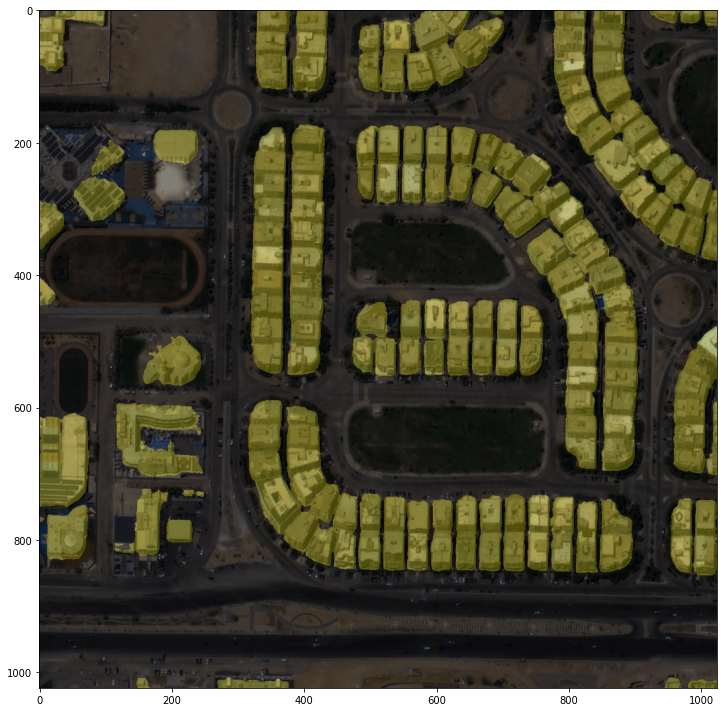

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_13000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


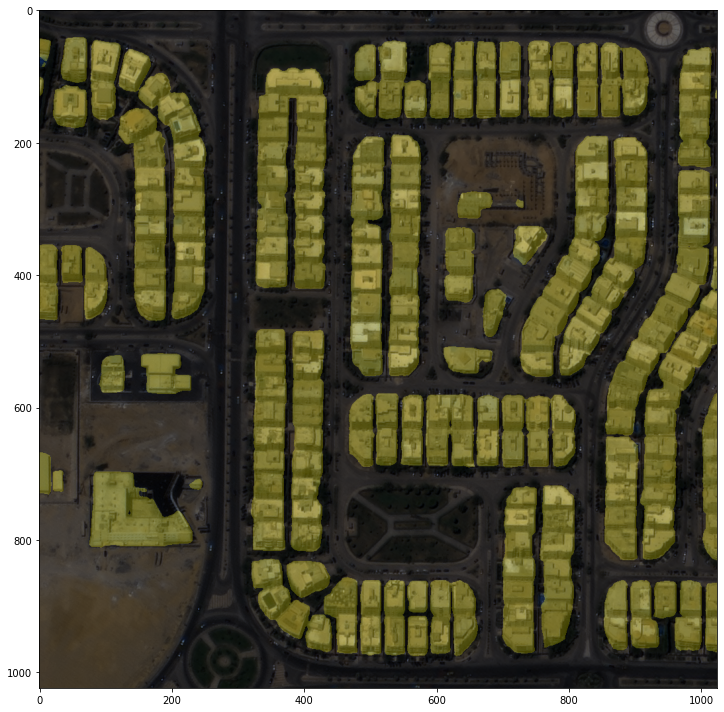

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


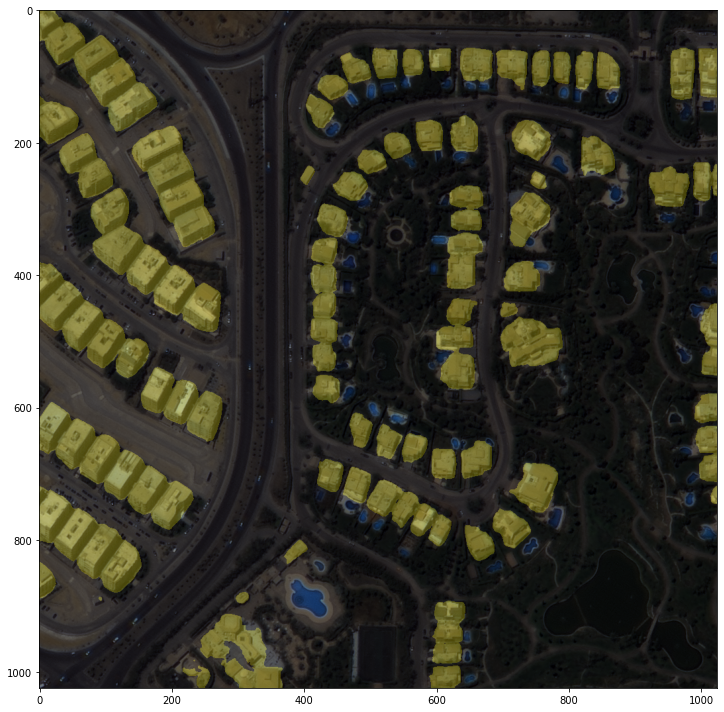

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


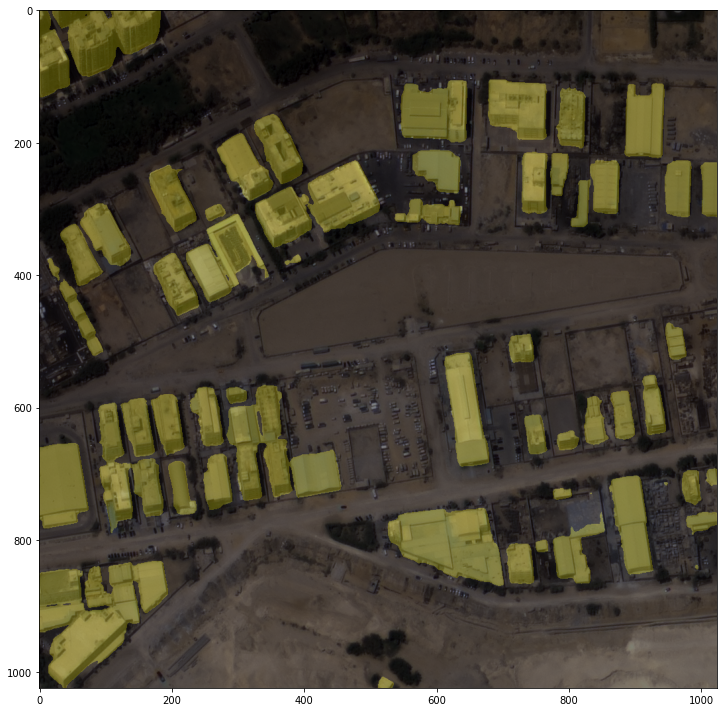

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


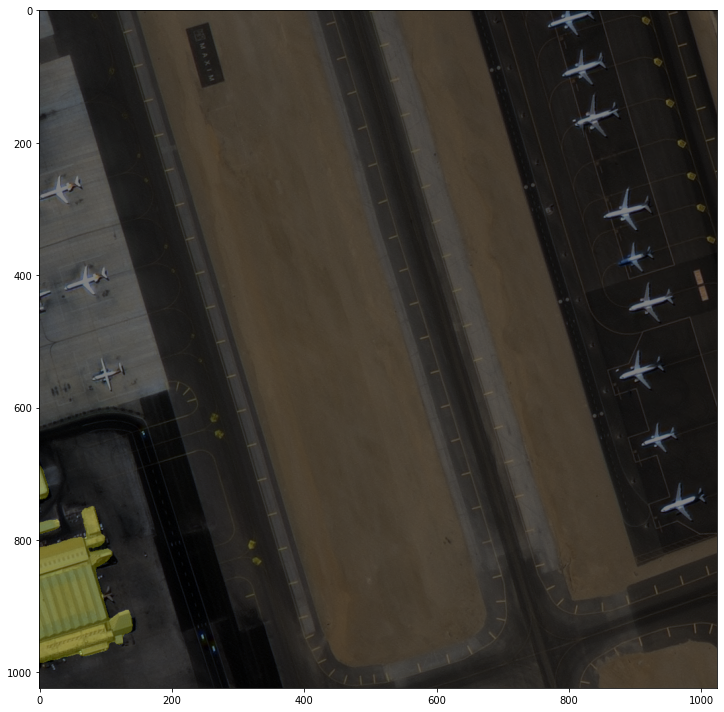

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


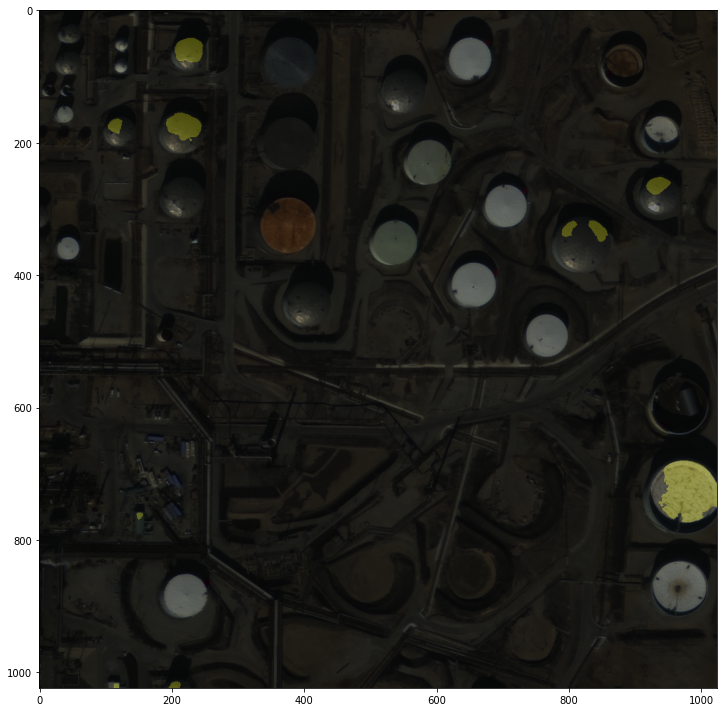

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


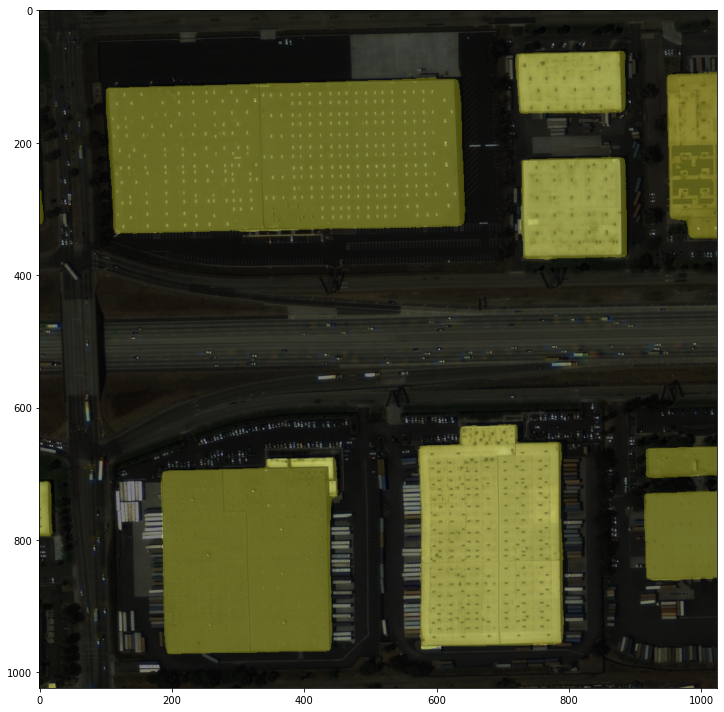

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


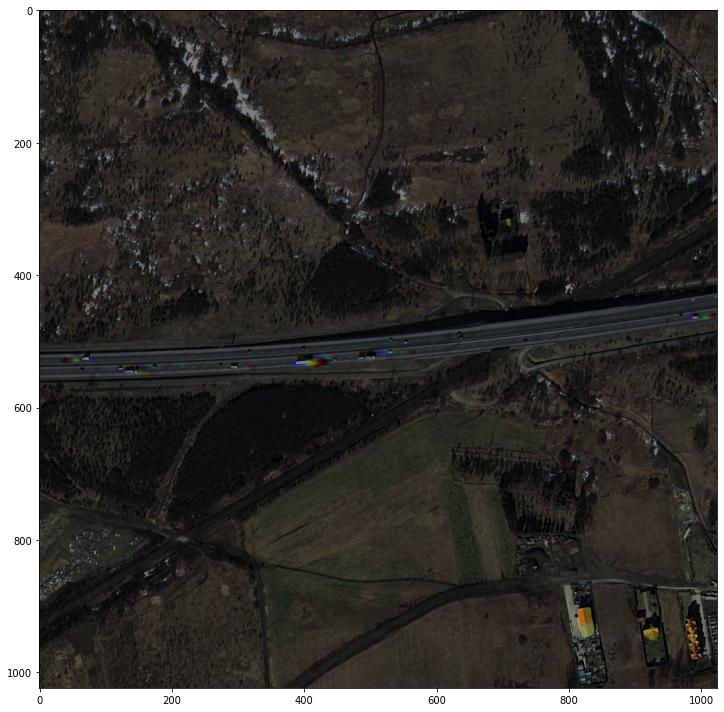

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


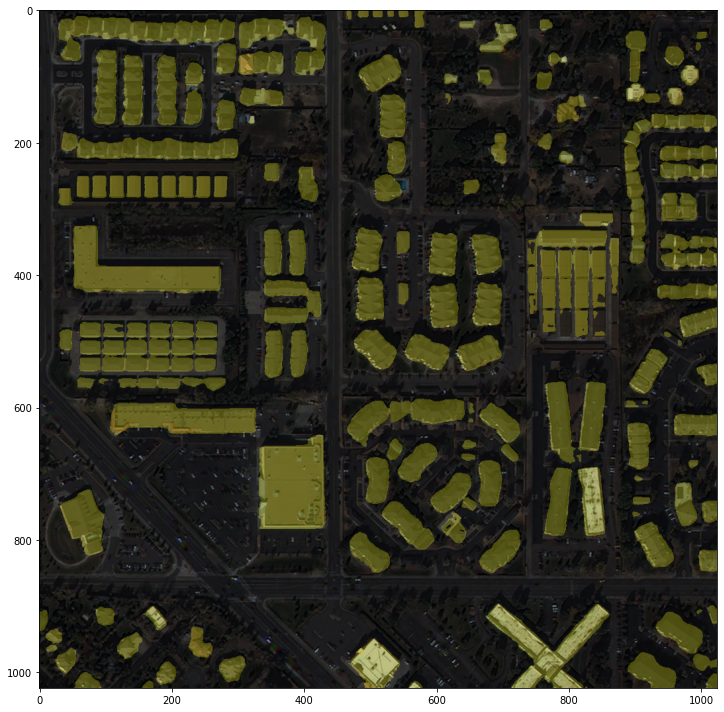

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


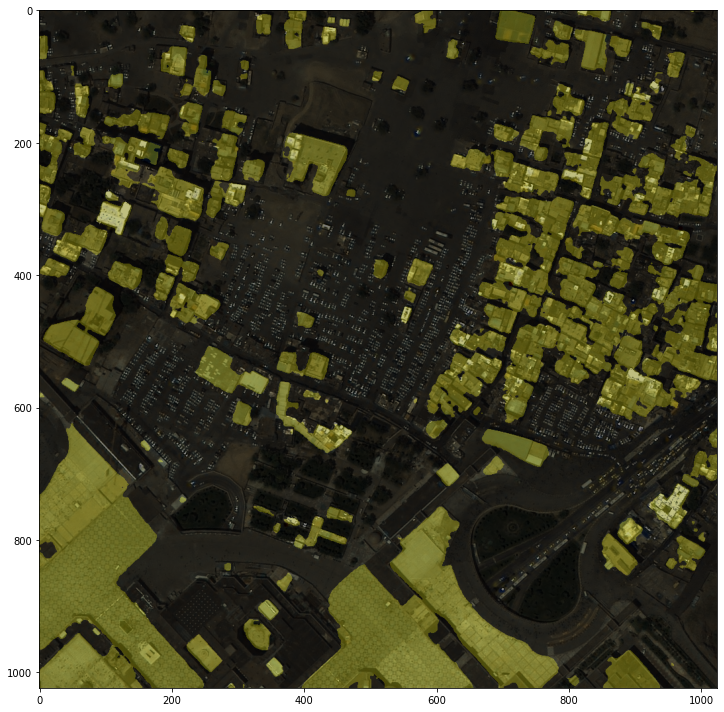

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


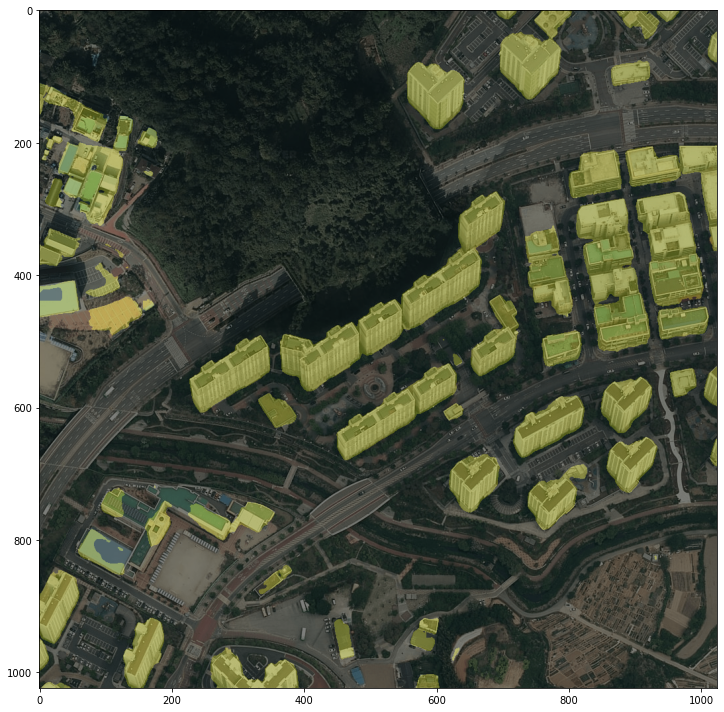

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


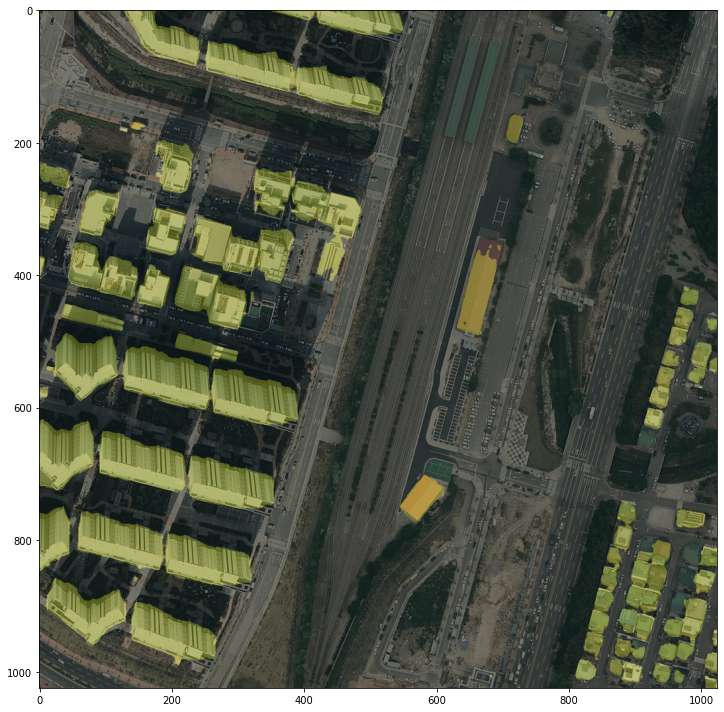

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


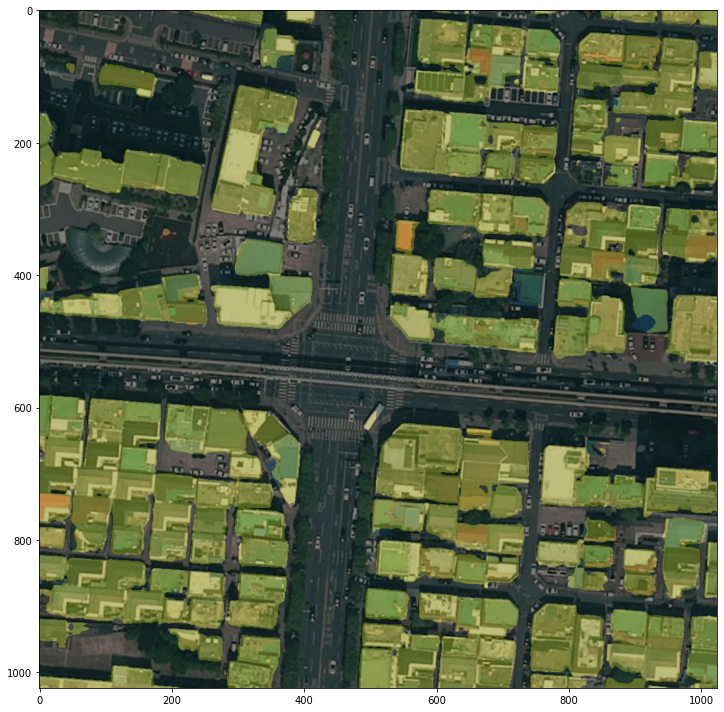

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)